# Sistema de Recomendación

## Análsis de las Bases de Datos encontradas

En la página de [Kaggle](https://www.kaggle.com/) se hizo una búsqueda de bases de datos que manejaran información de hoteles, reseñas y usuarios. A contunuación se hace un análisis de algunas de ellas en función de las necesidades que tenemos para nuesrto proyecto.

In [260]:
# Librerías

import numpy as np
import pandas as pd
import sklearn 
import matplotlib.pyplot as plt
import seaborn as sns 

### Hotel Reviews Data in Europe

La base de datos [515K Hotel Reviews Data in Europe](https://www.kaggle.com/datasets/jiashenliu/515k-hotel-reviews-data-in-europe) contiene 500 mil registros con reseñas de usuarios que visitaron 1493 hoteles de lujo en diferentes países europeos. 

Esta información fue obtenida de Booking.com. Dichos datos en el archivo se encuentran disponibles de manera publica y originalmente pertenecen a Booking.com.


In [369]:
hotel_reviews_eu = pd.read_csv("DataBases/Hotel_Reviews_EU.csv/Hotel_Reviews.csv")
hotel_reviews_eu.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


La información está condensada en una sola tabla con 17 columnas. Entre la información se encuentra el nombre del hotel, el país donde se encuetra y su geolocalización. También cuenta con la nacionalidad del ususario, las reseñas (positivas y negativas), el puntaje de la reseña y la cantidad de reseñas dadas por un mismo usuario.

Así mismo, cuenta con una columna que indica la razón de la visita al hotel, `Tag`, en la que pueden encontrar tags como `Leisure trip`, `Solo traveler`, `Duplex`, `Family with young children`, entre otros.	

Infortunadamente, no se no se tiene información individal por usuario, no hay un identificador que permita reconocerlos más allá de la nacionalidad y el número de reseñas que hicieron en sus diferentes visitas.


#### HOTELES

In [371]:
hotel_reviews_eu.reset_index()
hotel_info_eu = hotel_reviews_eu[['Hotel_Name', 'Hotel_Address', 'lat', 'lng']].drop_duplicates(keep='first', ignore_index=True)
hotel_info_eu.insert(0, 'hotel_id', range(0, len(hotel_info_eu)))
hotel_info_eu.insert(1, 'hotel_country', hotel_info_eu['Hotel_Address'].str.split().str[-1])

hotel_info_eu.loc[hotel_info_eu['hotel_country'] == 'Kingdom', ['hotel_country']] = 'United Kingdom'

print(f"Total de Registros: {len(hotel_info_eu)}")
hotel_info_eu.head()

Total de Registros: 1494


,hotel_id,hotel_country,Hotel_Name,Hotel_Address,lat,lng
0,0,Netherlands,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,52.360576,4.915968
1,1,United Kingdom,K K Hotel George,1 15 Templeton Place Earl s Court Kensington a...,51.491888,-0.194971
2,2,United Kingdom,Apex Temple Court Hotel,1 2 Serjeant s Inn Fleet Street City of London...,51.513734,-0.108751
3,3,United Kingdom,The Park Grand London Paddington,1 3 Queens Garden Westminster Borough London W...,51.514218,-0.180903
4,4,France,Monhotel Lounge SPA,1 3 Rue d Argentine 16th arr 75116 Paris France,48.874348,2.289733


In [263]:
# Extracting unique names
unique_names = hotel_info_eu['Hotel_Name'].unique()
unique_address = hotel_info_eu['Hotel_Address'].unique()

print(f"Se tienen {len(unique_names)} hoteles con {len(unique_address)} direcciones diferentes")

Se tienen 1492 hoteles con 1493 direcciones diferentes


In [264]:
# Finding duplicate Hotel Names
duplicate_rows = hotel_info_eu[hotel_info_eu.duplicated(subset=['Hotel_Name'])]
duplicate_rows

,hotel_id,hotel_country,Hotel_Name,Hotel_Address
1251,1251,Austria,Hotel Regina,Rooseveltplatz 15 09 Alsergrund 1090 Vienna Au...
1336,1336,Italy,Hotel Regina,Via Cesare Correnti 13 Milan City Center 20123...


In [265]:
# Finding duplicate hotel Addreses
duplicate_rows = hotel_info_eu[hotel_info_eu.duplicated(subset=['Hotel_Address'])]
duplicate_rows

,hotel_id,hotel_country,Hotel_Name,Hotel_Address
724,724,United Kingdom,Club Quarters Hotel Trafalgar Square,8 Northumberland Avenue Westminster Borough Lo...


In [266]:
dup_add = hotel_info_eu[hotel_info_eu['hotel_id'] == 724]
info = hotel_info_eu[hotel_info_eu['Hotel_Address'] == dup_add['Hotel_Address'].iloc[0]]
info

,hotel_id,hotel_country,Hotel_Name,Hotel_Address
723,723,United Kingdom,The Grand at Trafalgar Square,8 Northumberland Avenue Westminster Borough Lo...
724,724,United Kingdom,Club Quarters Hotel Trafalgar Square,8 Northumberland Avenue Westminster Borough Lo...


El total de registros es de `1494` pero hay dos regitros que tienen un duplicado.

Por una parte, el hotel `Hotel Regina`tiene sucursal en Austria e Italy, por lo que son dos lugares diferentes, con direcciones físicas diferentes.

El otro duplicado es la dirección del hotel, ya que dos razones sociales diferentes, dos nombres de hotel diferentes, operan en la misma dirección: `The Grand at Trafalgar Square` y `Club Quarters Hotel Trafalgar Square`.

Para evitar confusiones al momento de asignar el hotel_id se recomienda usar el nombre del hotel junto con el país donde está ubicado.

In [267]:
from collections import Counter

contador_paises = Counter(pais for pais in hotel_info_eu['hotel_country'])
print(f"Los hoteles está distribuidos en {len(contador_paises)} países en el dataset.")
#contador_paises

Los hoteles está distribuidos en 6 países en el dataset.


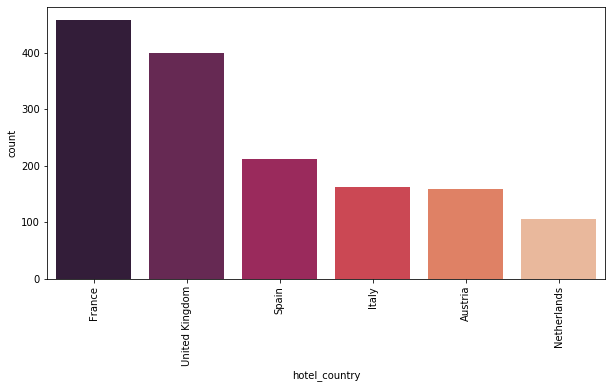

In [268]:
paises_counts_df = pd.DataFrame([contador_paises]).T.reset_index()
paises_counts_df.columns = ['hotel_country', 'count']
paises_counts_df = paises_counts_df.sort_values(by='count', ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x='hotel_country', y='count', data=paises_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()

In [269]:
paises_counts_df.head()

,hotel_country,count
2,France,458
1,United Kingdom,400
3,Spain,211
4,Italy,162
5,Austria,158


Hay 6 países en el dataset, con 1494 hoteles distribuidos en la siguiente manera:
| País | Hoteles |
|------|---------|
| France | 458 |
| United Kingdom | 400 |
| Spain | 211 |
| Italy | 162 |
| Austria | 158 |
| Netherlands | 105 |

Siendo `Francia` el país más visitado seguido por `United Kingdom`.


#### RESEÑAS

In [270]:
review_info_eu = hotel_reviews_eu[['Hotel_Name', 'Hotel_Address', 'Reviewer_Nationality', 'Negative_Review', 'Positive_Review', 
                            'Reviewer_Score', 'Review_Date', 'Total_Number_of_Reviews_Reviewer_Has_Given']]

review_info_eu.insert(0, 'name_address', [None] * len(review_info_eu))
review_info_eu['name_address'] = review_info_eu['Hotel_Name'] + review_info_eu['Hotel_Address']

# dictionary
hotel_dict = {row.Hotel_Name + row.Hotel_Address : row.hotel_id for (index, row) in hotel_info_eu.iterrows()}
review_info_eu = review_info_eu.replace({"name_address": hotel_dict})

review_info_eu.drop(columns=['Hotel_Name', 'Hotel_Address'])
review_info_eu.columns = review_info_eu.columns.str.replace('name_address', 'hotel_id')

/Users/feratus/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [271]:
review_info_eu.head()

,hotel_id,Hotel_Name,Hotel_Address,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,Total_Number_of_Reviews_Reviewer_Has_Given
0,0,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,Russia,I am so angry that i made this post available...,Only the park outside of the hotel was beauti...,2.9,8/3/2017,7
1,0,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,Ireland,No Negative,No real complaints the hotel was great great ...,7.5,8/3/2017,7
2,0,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,Australia,Rooms are nice but for elderly a bit difficul...,Location was good and staff were ok It is cut...,7.1,7/31/2017,9
3,0,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,United Kingdom,My room was dirty and I was afraid to walk ba...,Great location in nice surroundings the bar a...,3.8,7/31/2017,1
4,0,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,New Zealand,You When I booked with your company on line y...,Amazing location and building Romantic setting,6.7,7/24/2017,3


In [272]:
contador_nacionalidades = Counter(pais for pais in review_info_eu['Reviewer_Nationality'])
print(f"Existen {len(contador_nacionalidades)} nacionalidades en el dataset.")
#contador_nacionalidades

Existen 227 nacionalidades en el dataset.


In [273]:
# type(contador_nacionalidades) >> collections.Counter
mas_comunes = contador_nacionalidades.most_common(20)
for item, conta in mas_comunes:
    print(f'{item}:{conta}')

 United Kingdom :245246
 United States of America :35437
 Australia :21686
 Ireland :14827
 United Arab Emirates :10235
 Saudi Arabia :8951
 Netherlands :8772
 Switzerland :8678
 Germany :7941
 Canada :7894
 France :7296
 Israel :6610
 Italy :6114
 Belgium :6031
 Turkey :5444
 Kuwait :4920
 Spain :4737
 Romania :4552
 Russia :3900
 South Africa :3821


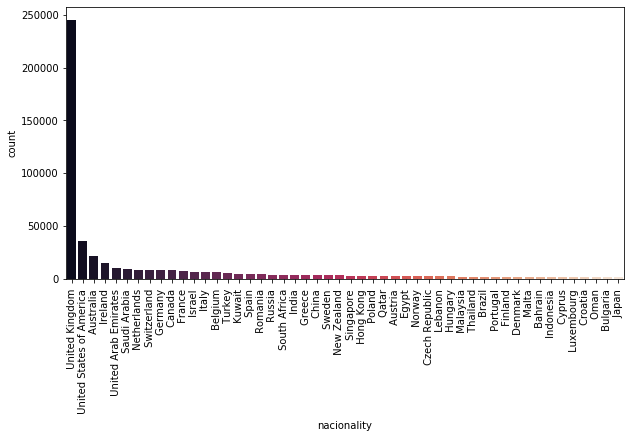

In [274]:
mas_comunes = contador_nacionalidades.most_common(50)
#print(mas_comunes)
#natio_counts_df = pd.DataFrame([mas_comunes]).T.reset_index()
natio_counts_df = pd.DataFrame(mas_comunes, columns=['nacionality', 'count'])
#natio_counts_df.columns = ['nacionality', 'count']
natio_counts_df = natio_counts_df.sort_values(by='count', ascending=False)

natio_counts_df.head()

plt.figure(figsize=(10, 5))
sns.barplot(x='nacionality', y='count', data=natio_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()

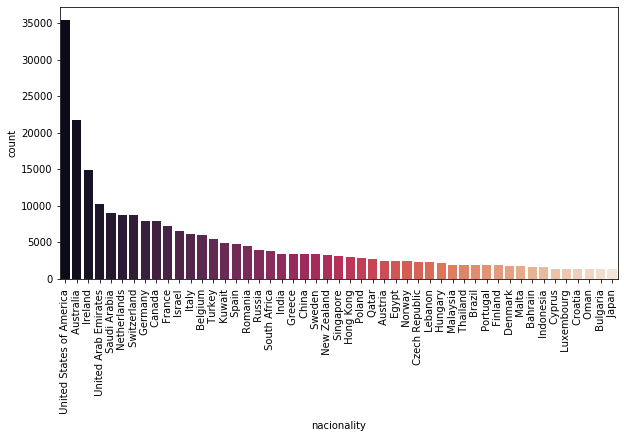

In [275]:
mas_comunes_noUK = mas_comunes
del(mas_comunes_noUK[0])
mas_comunes_noUK

natio_counts_df = pd.DataFrame(mas_comunes_noUK, columns=['nacionality', 'count'])
natio_counts_df = natio_counts_df.sort_values(by='count', ascending=False)

natio_counts_df.head()

plt.figure(figsize=(10, 5))
sns.barplot(x='nacionality', y='count', data=natio_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()


Los viajeros más que más visitan Europa son de `United Kingdom`, seguido por `USA`, `Australia`, `Irlanda` y `Emiratos Arabes`.

In [276]:
df = review_info_eu.copy()

df.drop(columns=['Hotel_Name', 'Hotel_Address'])
df.columns = df.columns.str.replace('Total_Number_of_Reviews_Reviewer_Has_Given', 'given_reviews')

# anadir las columnas para manipular el dataframe
df.insert(0, 'temp_id', range(1, len(df)+1))
df.insert(1, 'user_id', [0 for i in range(len(df))])

In [277]:
#
df_suffled = df.sample(frac=1).reset_index(drop=True)
df_copy = df_suffled.copy()#[0:10000] # para tomar una muestra de los datos
df_copy.head()

,temp_id,user_id,hotel_id,Hotel_Name,Hotel_Address,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,given_reviews
0,280246,0,831,H10 Itaca,Avenida Roma 22 30 Eixample 08015 Barcelona Spain,United Arab Emirates,No variety in the breakfast buffet as we can ...,The staff ate very friendly and the location ...,5.4,9/8/2015,3
1,310810,0,913,Jaz Amsterdam,De Passage 90 Noord Holland Zuidoost 1101 AX A...,United Arab Emirates,nothing,bedroom decoration and facilities were great,9.6,6/1/2016,4
2,481598,0,1384,Hotel Manin,Via Manin 7 Milan City Center 20121 Milan Italy,South Africa,At reception not all the staff were courteous,Location,7.1,10/14/2015,1
3,33811,0,77,11 Cadogan Gardens,11 Cadogan Gardens Sloane Square Kensington an...,United States of America,No Negative,Small boutique hotel with friendly staff in a...,10.0,12/21/2016,4
4,12236,0,15,Crowne Plaza London Kings Cross,1 Kings Cross Road Islington London WC1X 9HX U...,United Kingdom,Extra charge to use swimming pool,Lovely room good breakfast,7.9,3/27/2016,1


In [281]:
df = df_copy.copy()

conta_usr = 1
for row in df.itertuples(index=True, name='Pandas'):
    #print(f"Index: {row.Index}, ID: {row.temp_id}, Name: {row.reviewer_nationality}, #Reviews: {row.given_reviews}")
    curr_row = row
    index = row.Index+1
    if index >= len(df): 
        break
    temp_df = df[index:] 
    
    tmp = df.loc[row.Index, ['user_id']].values[0]
    #print(f"user_id: {tmp}")
    if tmp == 0:
        df.loc[row.Index, ['user_id']] = conta_usr
        print(f"new user... {conta_usr}")
        conta_usr = conta_usr + 1
        
        conta_revs = 1
        print(f"analizando index {row.Index}, ID: {row.temp_id}")
        for rowin in temp_df.itertuples(index=True, name='Pandas'):
            #print(f"\tIndex: {rowin.Index}, ID: {rowin.temp_id}, Name: {rowin.Reviewer_Nationality}, #Reviews: {rowin.given_reviews}")
            
            # different hotels
            if row.Reviewer_Nationality == rowin.Reviewer_Nationality and (row.given_reviews == rowin.given_reviews) and rowin.user_id == 0 and row.hotel_id != rowin.hotel_id:
            # could be same hotel, but different dates
            #if row.Reviewer_Nationality == rowin.Reviewer_Nationality and (row.given_reviews == rowin.given_reviews) and rowin.user_id == 0 and row.Review_Date != rowin.Review_Date:
                 #print(f"\t{row.reviewer_nationality} / {conta_revs}:")
                conta_revs = conta_revs + 1
                df.loc[rowin.Index, ['user_id']] = df.loc[row.Index, ['user_id']]

            if conta_revs >= row.given_reviews:
                #print("breaking...")
                break
        

new user... 1
analizando index 0, ID: 280246
new user... 2
analizando index 1, ID: 310810
new user... 3
analizando index 2, ID: 481598
new user... 4
analizando index 3, ID: 33811
new user... 5
analizando index 4, ID: 12236
new user... 6
analizando index 5, ID: 486713
new user... 7
analizando index 6, ID: 256682
new user... 8
analizando index 7, ID: 54221
new user... 9
analizando index 8, ID: 261899
new user... 10
analizando index 9, ID: 378923
new user... 11
analizando index 10, ID: 185500
new user... 12
analizando index 11, ID: 150121
new user... 13
analizando index 12, ID: 143436
new user... 14
analizando index 13, ID: 128737
new user... 15
analizando index 14, ID: 305469
new user... 16
analizando index 17, ID: 250413
new user... 17
analizando index 19, ID: 419561
new user... 18
analizando index 20, ID: 204572
new user... 19
analizando index 21, ID: 136294
new user... 20
analizando index 22, ID: 316895
new user... 21
analizando index 23, ID: 331018
new user... 22
analizando index 25,

In [ ]:
df.to_csv('reviews_with_user_id.csv')

In [376]:
#df.to_csv('reviews_with_user_id.csv')
#print(df.sample(n=10))
df[df.user_id == 1]

,temp_id,user_id,hotel_id,Hotel_Name,Hotel_Address,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Review_Date,given_reviews
0,280246,1,831,H10 Itaca,Avenida Roma 22 30 Eixample 08015 Barcelona Spain,United Arab Emirates,No variety in the breakfast buffet as we can ...,The staff ate very friendly and the location ...,5.4,9/8/2015,3
710,460826,1,1304,Ramada Apollo Amsterdam Centre,Staalmeesterslaan 410 Slotervaart 1057 PH Amst...,United Arab Emirates,No Negative,Great staff,10.0,7/14/2016,3
1133,163722,1,483,Eccleston Square Hotel,37 Eccleston Square Westminster Borough London...,United Arab Emirates,Room and corridors a little small for very pr...,Tea service,7.1,11/1/2015,3


In [399]:
df_user = df[df.user_id == 456]
df_user[['user_id', 'Hotel_Name', 'Reviewer_Nationality', 'Reviewer_Score', 'given_reviews']]

,user_id,Hotel_Name,Reviewer_Nationality,Reviewer_Score,given_reviews
632,456,DoubleTree by Hilton London Ealing,United Kingdom,9.6,17
769,456,Grand Hotel Amr th Amsterdam,United Kingdom,9.6,17
1052,456,Intercontinental London The O2,United Kingdom,9.6,17
1381,456,Hilton London Wembley,United Kingdom,9.2,17
1508,456,Hotel de France Wien,United Kingdom,8.8,17
1539,456,Grand Hotel Amr th Amsterdam,United Kingdom,8.3,17
1860,456,Hotel Okura Amsterdam,United Kingdom,7.9,17
2104,456,Danubius Hotel Regents Park,United Kingdom,8.8,17
2357,456,De Vere Devonport House,United Kingdom,7.5,17
2850,456,Copthorne Tara Hotel London Kensington,United Kingdom,8.3,17


In [278]:
num_unique_users = df['user_id'].nunique()
print("Number of different users:", num_unique_users)

Number of different users: 1


In [ ]:
len(df[df.Reviewer_Nationality == ' Belgium '])

La base de datos tienen un contador para el número de reseñas que han proporcionado los usuarios, por lo que hay usuarios que han hecho reseñas más de una vez. Esto indica que han visitado más de un hotel o, incluso, puede que hayan visitado el mismo hotel más de una vez.
Para asignar los ids de usuarios, se tienen las siguienes suposiciones:

1. un mismo huésped puede visitar el mismo hotel en múltiples ocasiones.
asumiendo que la 'fecha del review' es la 'fecha del checkout', éstas debe ser diferentes para el mismo usuario
* en una muestra de 1000 registros, se genera 694 usuarios (9 segs)
    * para clientes de ' Ireland ', se generan 26 registros
    * para clientes de ' Belgium ' se generan 13 registros

- en una muestra de 10000 registros, se genera 5323 usuarios (1min 51.4segs)
    - para clientes de ' Ireland ', se generan 266 registros   
    - para clientes de ' Belgium ' se generan 111 registros

2. un mismo huésped NO visita más de una vez el mismo hotel.
se asume que el hotel debe ser diferente para cada visita: un usuario con varias reseñas ha visitado hoteles diferentes.
* en una muestra de 1000 registros, se generan 696 usuarios (9 segs)
    * para clientes de ' Ireland ' se generan 16 registros
    * para clientes de ' Blgium ' se generan 13 registros
* en una muestra de 10000 registros, se genera 5331 usuarios (1m 51.9segs)
    * para clientes de ' Ireland ' se generan 266 registros
    * para clientes de ' Belgium ' se generan 111 registros


Las dos suposiciones llevan a obtener resultados muy similares, por lo que se puede inferir que un usuario no se ha hospedado más de una vez en el mismo hotel. Los tiempos de procesamiento también son muy parecidos

### Hotel Reviews

La base de datos [Hotel Reviews](https://www.kaggle.com/datasets/datafiniti/hotel-reviews) contiene una lista de 1,000 hoteles con sus respectivas reseñas.

In [284]:
hotel_reviews_datafin = pd.read_csv("DataBases/Hotel Reviews/Datafiniti_Hotel_Reviews.csv")
hotel_reviews_datafin.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,...,reviews.dateSeen,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sourceURLs,websites
0,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,...,"2016-08-03T00:00:00Z,2016-07-26T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,Our experience at Rancho Valencia was absolute...,Best romantic vacation ever!!!!,NaN,NaN,Paula,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
1,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,...,"2016-08-02T00:00:00Z,2016-08-26T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,Amazing place. Everyone was extremely warm and...,Sweet sweet serenity,NaN,NaN,D,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
2,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,...,"2016-11-15T00:00:00Z,2016-08-23T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,We booked a 3 night stay at Rancho Valencia to...,Amazing Property and Experience,NaN,NaN,Ron,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
3,AVwdOclqIN2L1WUfti38,2015-11-28T19:19:35Z,2018-09-10T21:06:16Z,7520 Teague Rd,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,Hanover,US,us/md/hanover/7520teaguerd/-2043779672,39.155929,...,"2016-05-21T00:00:00Z,2016-07-31T00:00:00Z",2.0,https://www.tripadvisor.com/Hotel_Review-g4118...,Currently in bed writing this for the past hr ...,"Never again...beware, if you want sleep.",Richmond,VA,jaeem2016,http://www.yellowbook.com/profile/aloft-arunde...,http://www.starwoodhotels.com/alofthotels/prop...
4,AVwdOclqIN2L1WUfti38,2015-11-28T19:19:35Z,2018-09-10T21:06:16Z,7520 Teague Rd,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,Hanover,US,us/md/hanover/7520teaguerd/-2043779672,39.155929,...,2016-07-31T00:00:00Z,5.0,https://www.tripadvisor.com/Hotel_Review-g4118...,I live in Md and the Aloft is my Home away fro...,ALWAYS GREAT STAY...,Laurel,MD,MamaNiaOne,http://www.yellowbook.com/profile/aloft-arunde...,http://www.starwoodhotels.com/alofthotels/prop...


In [368]:
print(f"Número de Columnas en el dataset: {hotel_reviews_datafin.columns.size}")
print(hotel_reviews_datafin.columns)


Número de Columnas en el dataset: 25
Index(['id', 'dateAdded', 'dateUpdated', 'address', 'categories',
       'primaryCategories', 'city', 'country', 'keys', 'latitude', 'longitude',
       'name', 'postalCode', 'province', 'reviews.date', 'reviews.dateSeen',
       'reviews.rating', 'reviews.sourceURLs', 'reviews.text', 'reviews.title',
       'reviews.userCity', 'reviews.userProvince', 'reviews.username',
       'sourceURLs', 'websites'],
      dtype='object')


In [293]:

# Setting display option to show all columns
pd.set_option('display.max_columns', None)

hotel_reviews_datafin.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,reviews.date,reviews.dateSeen,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sourceURLs,websites
0,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,-117.186136,Rancho Valencia Resort Spa,92067,CA,2013-11-14T00:00:00Z,"2016-08-03T00:00:00Z,2016-07-26T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,Our experience at Rancho Valencia was absolute...,Best romantic vacation ever!!!!,NaN,NaN,Paula,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
1,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,-117.186136,Rancho Valencia Resort Spa,92067,CA,2014-07-06T00:00:00Z,"2016-08-02T00:00:00Z,2016-08-26T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,Amazing place. Everyone was extremely warm and...,Sweet sweet serenity,NaN,NaN,D,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
2,AVwc252WIN2L1WUfpqLP,2016-10-30T21:42:42Z,2018-09-10T21:06:27Z,5921 Valencia Cir,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Rancho Santa Fe,US,us/ca/ranchosantafe/5921valenciacir/359754519,32.990959,-117.186136,Rancho Valencia Resort Spa,92067,CA,2015-01-02T00:00:00Z,"2016-11-15T00:00:00Z,2016-08-23T00:00:00Z,2016...",5.0,https://www.hotels.com/hotel/125419/reviews%20/,We booked a 3 night stay at Rancho Valencia to...,Amazing Property and Experience,NaN,NaN,Ron,http://www.hotels.com/ho125419/%25252525253Flo...,http://www.ranchovalencia.com
3,AVwdOclqIN2L1WUfti38,2015-11-28T19:19:35Z,2018-09-10T21:06:16Z,7520 Teague Rd,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,Hanover,US,us/md/hanover/7520teaguerd/-2043779672,39.155929,-76.716341,Aloft Arundel Mills,21076,MD,2016-05-15T00:00:00Z,"2016-05-21T00:00:00Z,2016-07-31T00:00:00Z",2.0,https://www.tripadvisor.com/Hotel_Review-g4118...,Currently in bed writing this for the past hr ...,"Never again...beware, if you want sleep.",Richmond,VA,jaeem2016,http://www.yellowbook.com/profile/aloft-arunde...,http://www.starwoodhotels.com/alofthotels/prop...
4,AVwdOclqIN2L1WUfti38,2015-11-28T19:19:35Z,2018-09-10T21:06:16Z,7520 Teague Rd,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,Hanover,US,us/md/hanover/7520teaguerd/-2043779672,39.155929,-76.716341,Aloft Arundel Mills,21076,MD,2016-07-09T00:00:00Z,2016-07-31T00:00:00Z,5.0,https://www.tripadvisor.com/Hotel_Review-g4118...,I live in Md and the Aloft is my Home away fro...,ALWAYS GREAT STAY...,Laurel,MD,MamaNiaOne,http://www.yellowbook.com/profile/aloft-arunde...,http://www.starwoodhotels.com/alofthotels/prop...


#### HOTELES

In [304]:
hotel_reviews_datafin.reset_index()

hotel_info_datafin = hotel_reviews_datafin[['id', 'name', 'address', 'postalCode', 'city', 'province','country', 'latitude', 'longitude']].drop_duplicates(keep='first', ignore_index=True)

hotel_info_datafin.insert(0, 'hotel_id', range(0, len(hotel_info_datafin)))

print(f"Total de Hoteles registrados: {len(hotel_info_datafin)}")
hotel_info_datafin.head()

Total de Hoteles registrados: 1853


,hotel_id,id,name,city,postalCode,province,country,latitude,longitude
0,0,AVwc252WIN2L1WUfpqLP,Rancho Valencia Resort Spa,Rancho Santa Fe,92067,CA,US,32.990959,-117.186136
1,1,AVwdOclqIN2L1WUfti38,Aloft Arundel Mills,Hanover,21076,MD,US,39.155929,-76.716341
2,2,AVwePiAX_7pvs4fzBSAl,Hampton Inn Suites PortlandVancouver,Vancouver,98684,WA,US,45.619212,-122.525196
3,3,AVwdUKE3_7pvs4fz4lE-,Hotel Phillips,Kansas City,64105,MO,US,39.100119,-94.584701
4,4,AVweQyWNkufWRAb5BZeg,The Inn at Solvang,Huntingdon,16652,PA,US,40.527478,-77.969763


In [342]:
unique_id = hotel_info_datafin['id'].unique()

unique_name = hotel_info_datafin['name'].unique()

unique_post = hotel_info_datafin['postalCode'].unique()

print(f"La base de datos tiene {unique_id.size} Hoteles registrados, de los cuales hay {unique_name.size} nombres diferentes distribuidos en {unique_post.size} Códigos Postales.")


La base de datos tiene 1853 Hoteles registrados, de los cuales hay 1670 nombres diferentes distribuidos en 1474 Códigos Postales.


In [345]:
# Finding duplicate Hotel Names
duplicates = hotel_info_datafin[hotel_info_datafin.duplicated(subset=['name'])]
print(f"los {len(duplicates)} Hoteles duplicados se debe a que el mismo hotel puede ser parte de una cadena en diferentes estados.")

los 183 Hoteles duplicados se debe a que el mismo hotel puede ser parte de una cadena en diferentes estados.


In [346]:
duplicates

,hotel_id,id,name,city,postalCode,province,country,latitude,longitude
147,147,AVwcr1EgIN2L1WUfnwTB,Econo Lodge,Acworth,30101,GA,US,34.075420,-84.65365
185,185,AVwddSUNByjofQCxpUr6,Econo Lodge,Pico Rivera,90660,CA,US,33.962190,-118.11092
227,227,AVwd7GbG_7pvs4fz-dGp,Quality Inn,Cedar Rapids,52402,IA,US,42.024410,-91.62132
265,265,AVwdpSmZIN2L1WUfx3Ti,Motel 6,Elkton,21921,MD,US,39.637420,-75.80849
274,274,AVweIMpmkufWRAb5APft,Quality Inn,Montgomeryville,18936,PA,US,40.254154,-75.24785
...,...,...,...,...,...,...,...,...,...
1777,1777,AVwdkZON_7pvs4fz7LES,Econo Lodge,Escanaba,49829,MI,US,45.756970,-87.07725
1779,1779,AVwefkLpIN2L1WUf5csY,Americas Best Value Inn,Ironwood,49938,MI,US,46.463370,-90.16975
1790,1790,AVwc6ndVByjofQCxjlhg,Americas Best Value Inn,Somerset,42503,KY,US,37.095360,-84.62074
1791,1791,AVweGu-NIN2L1WUf2Bve,Budget Inn,Nashville,71852,AR,US,33.950500,-93.84155


In [298]:
contador_estados = Counter(pais for pais in hotel_info_datafin['province'])
print(f"Existen {len(contador_estados)} estados en el dataset.")


Existen 49 estados en el dataset.


El conjunto de datos tiene 1853 hoteles, distribuidos en 49 estados en Estados Unidos de America.

In [300]:

# type(contador_nacionalidades) >> collections.Counter
mas_comunes = contador_estados.most_common(10)
for item, conta in mas_comunes:
    print(f'{item}:{conta}')

CA:171
FL:129
TX:106
VA:91
PA:74
IL:65
NY:64
GA:60
OH:58
TN:52


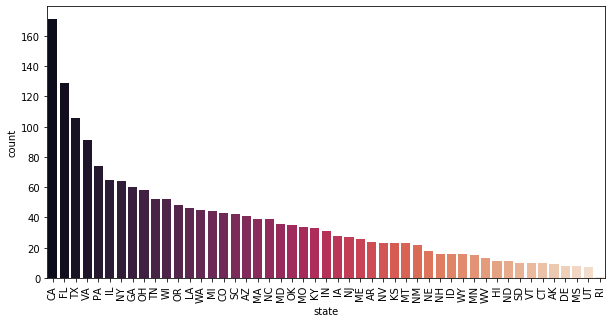

In [302]:
mas_comunes = contador_estados.most_common(50)
sates_counts_df = pd.DataFrame(mas_comunes, columns=['state', 'count'])
sates_counts_df = sates_counts_df.sort_values(by='count', ascending=False)

sates_counts_df.head()

plt.figure(figsize=(10, 5))
sns.barplot(x='state', y='count', data=sates_counts_df, palette='rocket')
plt.xticks(rotation=90)
plt.show()

La mayor cantidad de hoteles reseñados están ubicados en California, seguidos por Florida, Texas y Virginia.

#### RESEÑAS

Se extraen los datos relevantes para el análisis

In [347]:
review_info_datafin = hotel_reviews_datafin[['id', 'categories', 'primaryCategories', 'reviews.username', 
                                             'reviews.userCity', 'reviews.userProvince', 'reviews.title', 
                                             'reviews.text', 'reviews.rating', 'reviews.date']]

review_info_datafin.insert(0, 'hotel_id', [None] * len(review_info_datafin))
review_info_datafin.loc[:, 'hotel_id'] = review_info_datafin.loc[:, 'id']

# dictionary
hotel_dict = {row.id : row.hotel_id for (index, row) in hotel_info_datafin.iterrows()}
review_info_datafin = review_info_datafin.replace({"hotel_id": hotel_dict})

print(f"Total de Registros: {len(review_info_datafin)}")
review_info_datafin.head()

/Users/feratus/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Total de Registros: 10000


,hotel_id,id,categories,primaryCategories,reviews.username,reviews.userCity,reviews.userProvince,reviews.title,reviews.text,reviews.rating,reviews.date
0,0,AVwc252WIN2L1WUfpqLP,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Paula,NaN,NaN,Best romantic vacation ever!!!!,Our experience at Rancho Valencia was absolute...,5.0,2013-11-14T00:00:00Z
1,0,AVwc252WIN2L1WUfpqLP,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,D,NaN,NaN,Sweet sweet serenity,Amazing place. Everyone was extremely warm and...,5.0,2014-07-06T00:00:00Z
2,0,AVwc252WIN2L1WUfpqLP,"Hotels,Hotels and motels,Hotel and motel reser...",Accommodation & Food Services,Ron,NaN,NaN,Amazing Property and Experience,We booked a 3 night stay at Rancho Valencia to...,5.0,2015-01-02T00:00:00Z
3,1,AVwdOclqIN2L1WUfti38,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,jaeem2016,Richmond,VA,"Never again...beware, if you want sleep.",Currently in bed writing this for the past hr ...,2.0,2016-05-15T00:00:00Z
4,1,AVwdOclqIN2L1WUfti38,"Hotels,Hotels and motels,Travel agencies and b...",Accommodation & Food Services,MamaNiaOne,Laurel,MD,ALWAYS GREAT STAY...,I live in Md and the Aloft is my Home away fro...,5.0,2016-07-09T00:00:00Z


In [359]:
# Finding duplicate review names
duplicate_users = review_info_datafin.duplicated(subset=['reviews.username'])
print(f"La base de datos tiene {len(review_info_datafin) - review_info_datafin['reviews.username'].nunique()} nombres de usuarios duplicados.")
review_info_datafin[duplicate_users]

La base de datos tiene 3058 nombres de usuarios duplicados.


,hotel_id,id,categories,primaryCategories,reviews.username,reviews.userCity,reviews.userProvince,reviews.title,reviews.text,reviews.rating,reviews.date
29,8,AWE7dKHFIxWefVJwyLgA,"Hotels,Corporate Lodging,Lodging,Hotel",Accommodation & Food Services,A verified traveler,NaN,NaN,Nice location,Excellent experience. Will come again and book...,5.0,2014-08-25T00:00:00.000Z
30,8,AWE7dKHFIxWefVJwyLgA,"Hotels,Corporate Lodging,Lodging,Hotel",Accommodation & Food Services,A verified traveler,NaN,NaN,Hampton Inn,"heat in room did not work properly, tv remote ...",2.0,2009-01-07T00:00:00.000Z
32,8,AWE7dKHFIxWefVJwyLgA,"Hotels,Corporate Lodging,Lodging,Hotel",Accommodation & Food Services,A verified traveler,NaN,NaN,"beautiful, convenient location",Brand new hotel in brand new retail area on th...,4.0,2011-02-08T00:00:00.000Z
34,8,AWE7dKHFIxWefVJwyLgA,"Hotels,Corporate Lodging,Lodging,Hotel",Accommodation & Food Services,A verified traveler,NaN,NaN,Awesome Stay,My sister came into town so we decided to go t...,4.0,2017-07-08T00:00:00.000Z
35,8,AWE7dKHFIxWefVJwyLgA,"Hotels,Corporate Lodging,Lodging,Hotel",Accommodation & Food Services,A verified traveler,NaN,NaN,Reasonable price for exceptional hotel,Free breakfast! Attentive staff Fantastic loca...,5.0,2014-07-18T00:00:00.000Z
...,...,...,...,...,...,...,...,...,...,...,...
9985,1843,AWCACesxIxWefVJwvFDm,"Hotels,Hotel",Accommodation & Food Services,Elena,NaN,NaN,Would not stay again,Room was not clean and smelled. Hotel culture ...,1.0,2015-09-09T00:00:00Z
9987,1844,AVwdDZWXkufWRAb510Ab,"Hotel,Hotels,Lodging",Accommodation & Food Services,Kim,NaN,NaN,One night on the road trip,Very nice hotel.,4.0,2015-01-10T00:00:00Z
9988,1844,AVwdDZWXkufWRAb510Ab,"Hotel,Hotels,Lodging",Accommodation & Food Services,Brian,NaN,NaN,Good for price.,Stayed here for a volleyball tournament close ...,3.0,2016-01-29T00:00:00Z
9989,1844,AVwdDZWXkufWRAb510Ab,"Hotel,Hotels,Lodging",Accommodation & Food Services,A Traveler,NaN,NaN,Nice hotel when equipment is working.,The microwave and refrigerator was not working...,4.0,2016-09-23T00:00:00Z


In [366]:
hotel_reviews_recomm = pd.read_csv("DataBases/Hotel Recommendation/hotels_RoomPrice.csv")
hotel_reviews_recomm.head()

,id,refid,hotelcode,websitecode,dtcollected,ratedate,los,guests,roomtype,onsiterate,netrate,currency,ratedescription,ratetype,sourceurl,roomamenities,maxoccupancy,ispromo,closed,discount,promoname,status_code,taxstatus,taxtype,taxamount,proxyused,israteperstay,mealinclusiontype,hotelblock,input_dtcollected
0,50677497,8646773,634876,5,2019-10-12 15:46:54,2019-11-02,1,1,Double Room,82.36,87.84,USD,"Room size: 15 m²/161 ft², Shower, 1 king bed",Cancellation policy,https://www.agoda.com/en-gb/the-old-cider-hous...,Air conditioning: ;Alarm clock: ;Carpeting: ;C...,1,Y,N,6.24,NaN,200,2,NaN,0.0,media:M3diAproxy@173.44.165.126:80,Y,Free Breakfast,NaN,2019-10-13
1,50672149,6234691,8328096,5,2019-10-12 15:47:45,2019-11-30,1,1,Vacation Home,636.09,0.00,USD,"Shower, Kitchenette, 2 bedrooms, 1 double bed ...",Cancellation policy,https://www.agoda.com/en-gb/pantlleni/hotel/be...,Air conditioning: ;Closet: ;Fireplace: ;Free W...,4,N,N,0.00,NaN,200,2,NaN,0.0,media:M3diAproxy@173.44.164.126:80,Y,NaN,NaN,2019-10-13
2,50643430,7015677,8323442,5,2019-10-12 15:47:00,2019-12-20,1,1,Vacation Home,591.74,0.00,USD,"Shower, Kitchenette, 2 bedrooms, 1 double bed ...",Extra low price! (non-refundable),https://www.agoda.com/en-gb/willow-cottage/hot...,Air conditioning: ;Closet: ;Dishwasher: ;Firep...,4,N,N,0.00,NaN,200,2,NaN,0.0,media:M3diAproxy@173.44.166.122:80,Y,NaN,NaN,2019-10-13
3,50650317,7327094,7975,5,2019-10-12 15:47:02,2019-12-28,1,1,Standard Triple Room,881.48,0.00,USD,"Room size: 20 m²/215 ft², Shower, 3 single beds",Extra low price! (non-refundable),https://www.agoda.com/en-gb/apollo-hotel-londo...,Air conditioning: ;Clothes rack: ;Coffee/tea m...,1,N,N,0.00,NaN,200,2,Tax 20%,0.0,media:M3diAproxy@209.242.219.141:80,Y,NaN,NaN,2019-10-13
4,50650318,7327094,7975,5,2019-10-12 15:47:02,2019-12-28,1,1,Standard Triple Room,897.53,0.00,USD,"Room size: 20 m²/215 ft², Shower, 3 single beds",Extra low price! (non-refundable),https://www.agoda.com/en-gb/apollo-hotel-londo...,Air conditioning: ;Clothes rack: ;Coffee/tea m...,3,N,N,0.00,NaN,200,2,VAT $ 179.51,0.0,media:M3diAproxy@209.242.219.141:80,Y,Free breakfast for {3},NaN,2019-10-13
